<a href="https://colab.research.google.com/github/tyczof/ML_Projects/blob/project_knn_logreg_decisiontree/Pietryga_Zofia_LMAD_PSI_L6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV

file_path = 'Telco-Customer-Churn.csv'
data = pd.read_csv(file_path)

print(data.info())
print(data.describe())
print(data.head())
print(data.isnull().sum())

data['TotalCharges'] = pd.to_numeric(data['TotalCharges'], errors='coerce')
data = data.dropna(subset=['TotalCharges'])

bins = [0, 12, 24, 48, 72]
labels = ['0-12 months', '12-24 months', '24-48 months', 'Over 48 months']
data['TenureGroup'] = pd.cut(data['tenure'], bins=bins, labels=labels, right=False)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7032 entries, 0 to 7031
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7032 non-null   object 
 1   gender            7032 non-null   object 
 2   SeniorCitizen     7032 non-null   int64  
 3   Partner           7032 non-null   object 
 4   Dependents        7032 non-null   object 
 5   tenure            7032 non-null   int64  
 6   PhoneService      7032 non-null   object 
 7   MultipleLines     7032 non-null   object 
 8   InternetService   7032 non-null   object 
 9   OnlineSecurity    7032 non-null   object 
 10  OnlineBackup      7032 non-null   object 
 11  DeviceProtection  7032 non-null   object 
 12  TechSupport       7032 non-null   object 
 13  StreamingTV       7032 non-null   object 
 14  StreamingMovies   7032 non-null   object 
 15  Contract          7032 non-null   object 
 16  PaperlessBilling  7032 non-null   object 


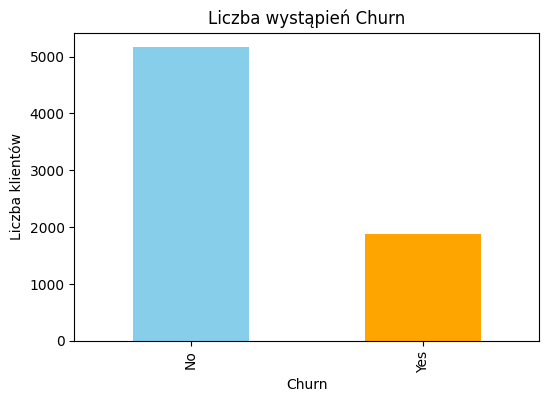

In [ ]:
data['Churn'].value_counts().plot(kind='bar', color=['skyblue', 'orange'], figsize=(6, 4))
plt.title('Liczba wystąpień Churn')
plt.xlabel('Churn')
plt.ylabel('Liczba klientów')
plt.show()


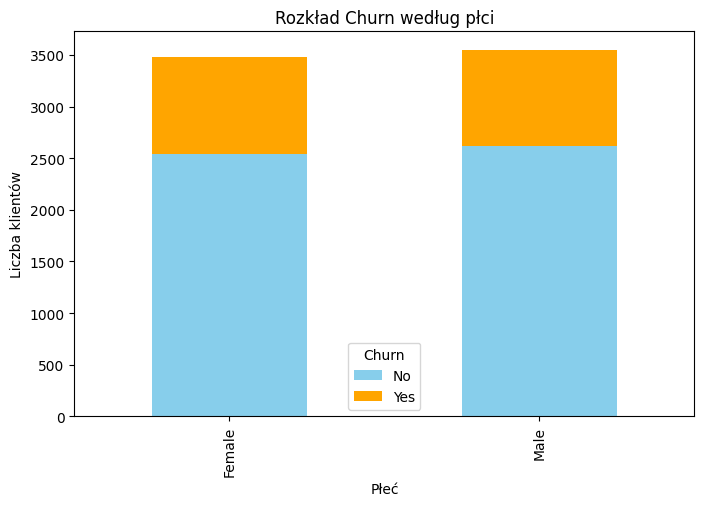

In [ ]:
churn_gender = data.groupby(['gender', 'Churn']).size().unstack()
churn_gender.plot(kind='bar', stacked=True, figsize=(8, 5), color=['skyblue', 'orange'])
plt.title('Rozkład Churn według płci')
plt.xlabel('Płeć')
plt.ylabel('Liczba klientów')
plt.legend(title='Churn')
plt.show()


<Figure size 800x600 with 0 Axes>

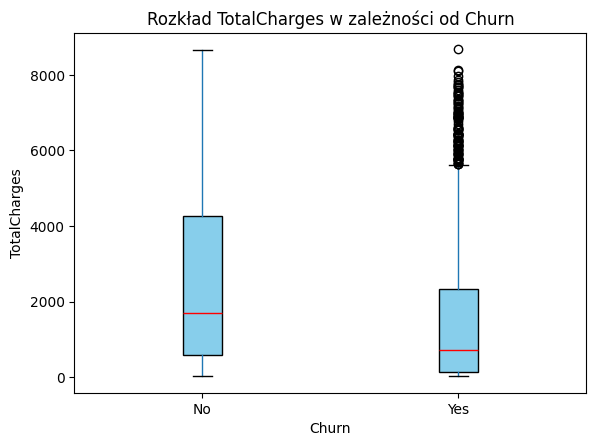

In [ ]:
plt.figure(figsize=(8, 6))
data.boxplot(column='TotalCharges', by='Churn', grid=False, patch_artist=True,
             boxprops=dict(facecolor='skyblue'), medianprops=dict(color='red'))
plt.title('Rozkład TotalCharges w zależności od Churn')
plt.suptitle('')
plt.xlabel('Churn')
plt.ylabel('TotalCharges')
plt.show()


<Figure size 800x600 with 0 Axes>

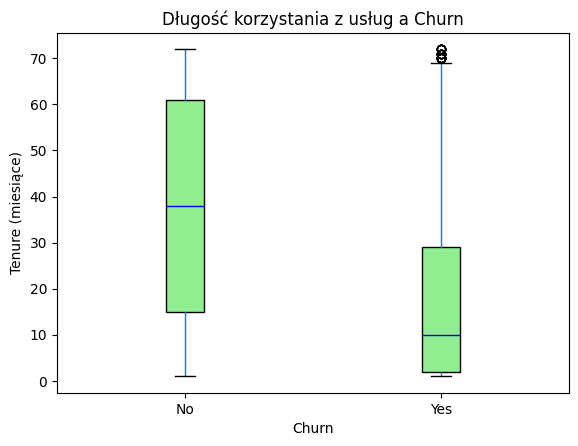

In [ ]:
plt.figure(figsize=(8, 6))
data.boxplot(column='tenure', by='Churn', grid=False, patch_artist=True,
             boxprops=dict(facecolor='lightgreen'), medianprops=dict(color='blue'))
plt.title('Długość korzystania z usług a Churn')
plt.suptitle('')
plt.xlabel('Churn')
plt.ylabel('Tenure (miesiące)')
plt.show()


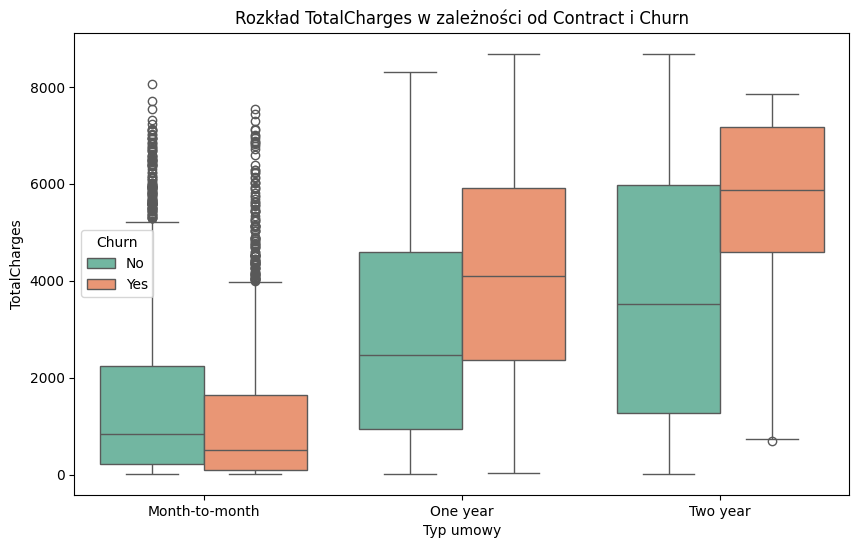

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Contract', y='TotalCharges', hue='Churn', data=data, palette='Set2')
plt.title('Rozkład TotalCharges w zależności od Contract i Churn')
plt.xlabel('Typ umowy')
plt.ylabel('TotalCharges')
plt.show()


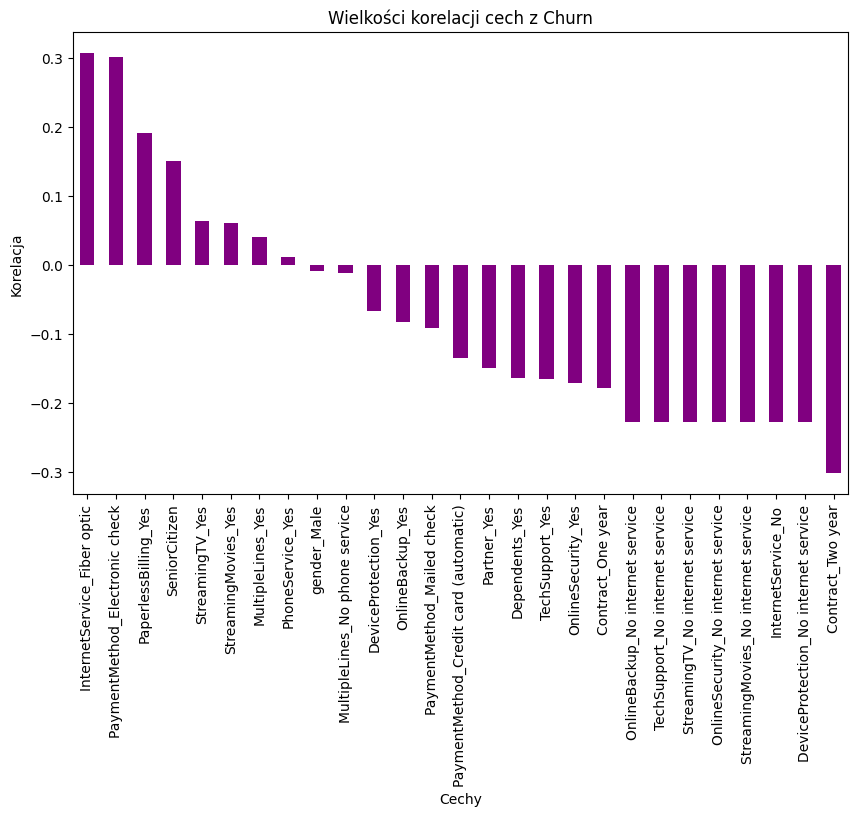

In [ ]:
columns_to_exclude = ['customerID', 'tenure', 'MonthlyCharges', 'TotalCharges', 'TenureGroup']
filtered_data = data.drop(columns=columns_to_exclude)

filtered_data_dummies = pd.get_dummies(filtered_data, drop_first=True)

correlations = filtered_data_dummies.corr()['Churn_Yes'].drop(['Churn_Yes'])

correlations.sort_values(ascending=False).plot(kind='bar', figsize=(10, 6), color='purple')
plt.title('Wielkości korelacji cech z Churn')
plt.ylabel('Korelacja')
plt.xlabel('Cechy')
plt.show()


In [ ]:
print(data['Contract'].value_counts())


Contract
Month-to-month    3875
Two year          1685
One year          1472
Name: count, dtype: int64


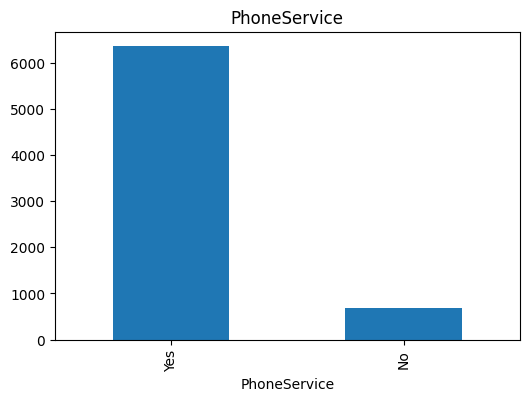

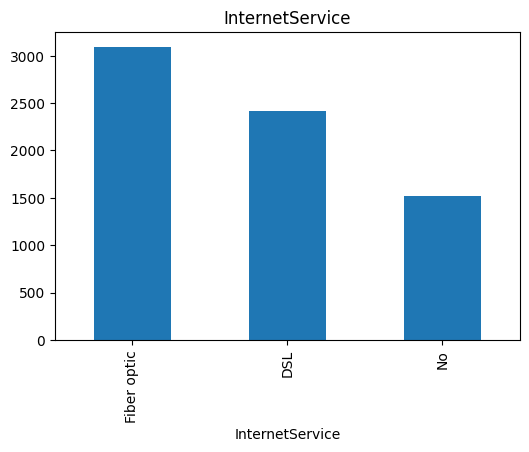

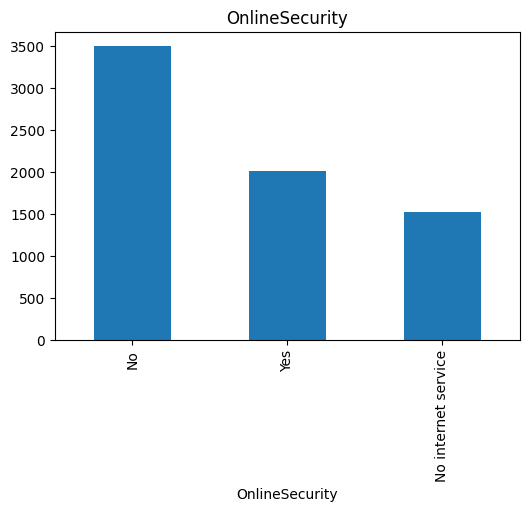

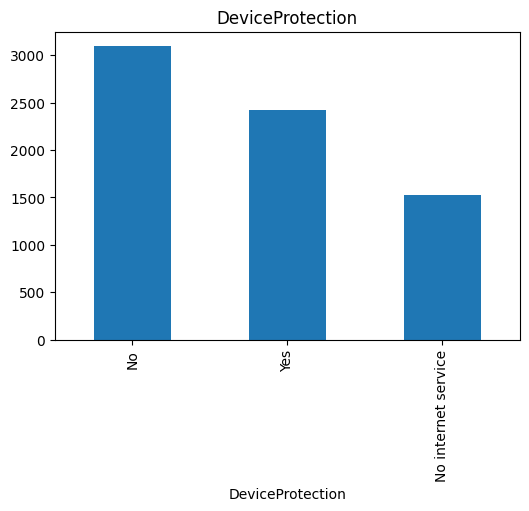

In [ ]:
services = ['PhoneService', 'InternetService', 'OnlineSecurity', 'DeviceProtection']
for service in services:
    data[service].value_counts().plot(kind='bar', title=service, figsize=(6, 4))
    plt.show()


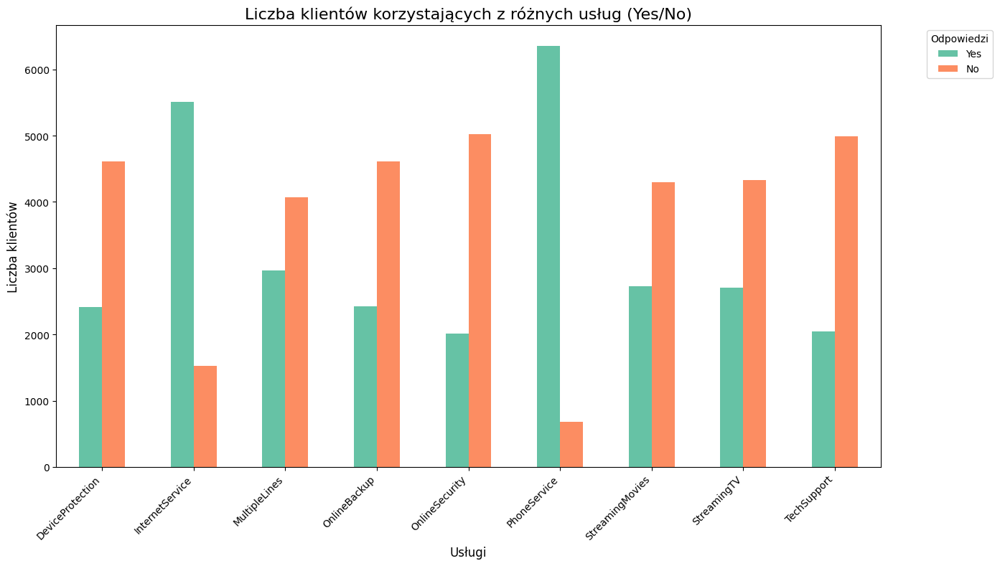

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

services_columns = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
                    'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']
services_data = data[services_columns]

services_long = services_data.melt(var_name="Service", value_name="Response")

services_long['Simplified_Response'] = services_long['Response'].apply(lambda x: 'No' if x.startswith('No') else 'Yes')

response_counts = services_long.groupby(['Service', 'Simplified_Response']).size().reset_index(name="Count")

pivot_data = response_counts.pivot(index="Service", columns="Simplified_Response", values="Count").fillna(0)

pivot_data = pivot_data[['Yes', 'No']]

pivot_data.plot(kind='bar', stacked=False, figsize=(14, 8), color=sns.color_palette("Set2"))  # Reverse the colors to match the order

plt.title("Liczba klientów korzystających z różnych usług (Yes/No)", fontsize=16)
plt.ylabel("Liczba klientów", fontsize=12)
plt.xlabel("Usługi", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Odpowiedzi", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



Procent odejść w zależności od PhoneService:
 Churn                No        Yes
PhoneService                      
No            75.000000  25.000000
Yes           73.252519  26.747481


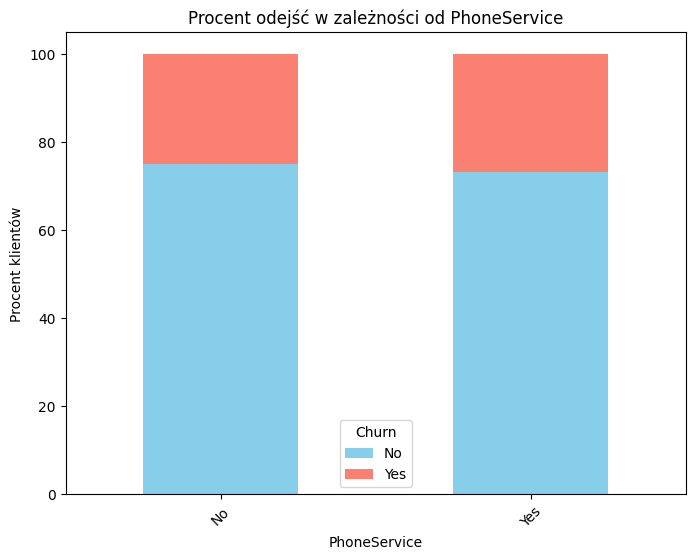


Procent odejść w zależności od InternetService:
 Churn                   No        Yes
InternetService                      
DSL              81.001656  18.998344
Fiber optic      58.107235  41.892765
No               92.565789   7.434211


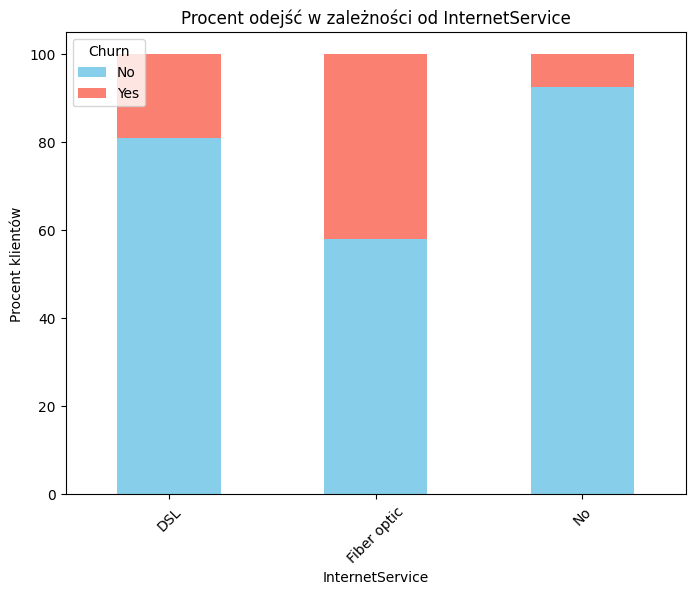


Procent odejść w zależności od TechSupport:
 Churn                       No        Yes
TechSupport                              
No                   58.352535  41.647465
No internet service  92.565789   7.434211
Yes                  84.803922  15.196078


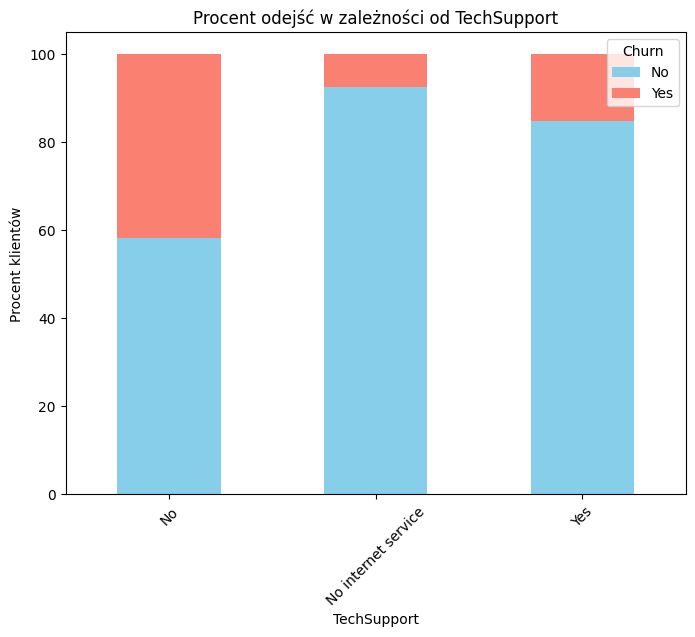


Procent odejść w zależności od OnlineSecurity:
 Churn                       No        Yes
OnlineSecurity                           
No                   58.221333  41.778667
No internet service  92.565789   7.434211
Yes                  85.359801  14.640199


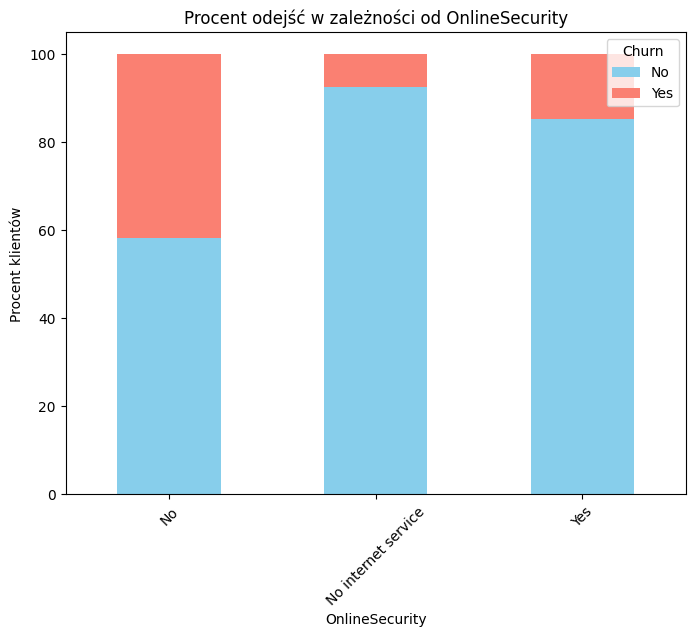

In [ ]:
services = ['PhoneService', 'InternetService', 'TechSupport', 'OnlineSecurity']
for service in services:
    service_churn = data.groupby([service, 'Churn']).size().unstack()
    service_churn_percent = service_churn.div(service_churn.sum(axis=1), axis=0) * 100
    print(f"\nProcent odejść w zależności od {service}:\n", service_churn_percent)

    # Wizualizacja
    service_churn_percent.plot(kind='bar', stacked=True, figsize=(8, 6), color=['skyblue', 'salmon'])
    plt.title(f'Procent odejść w zależności od {service}')
    plt.ylabel('Procent klientów')
    plt.xlabel(service)
    plt.xticks(rotation=45)
    plt.legend(title='Churn', loc='best')
    plt.show()


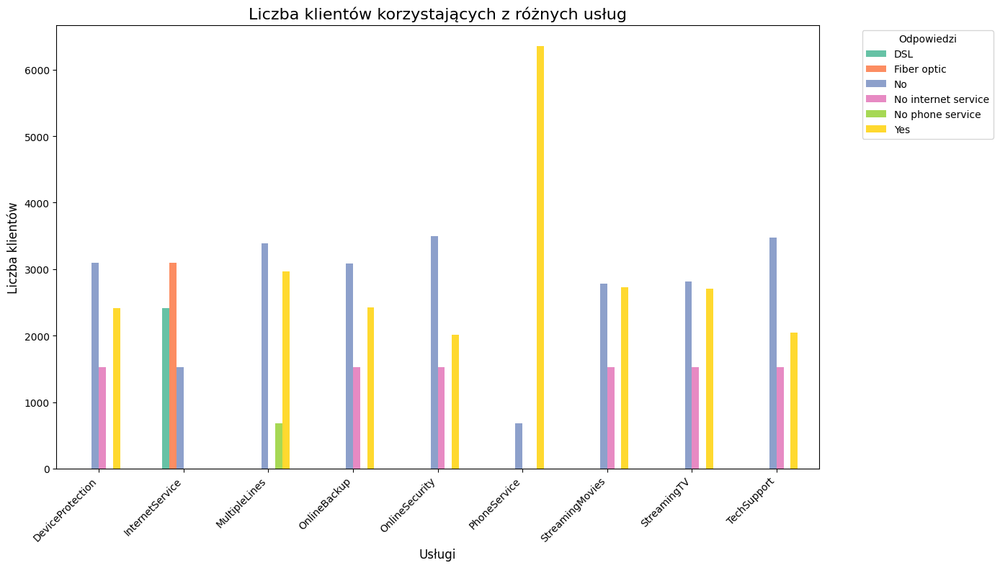

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

response_counts = services_long.groupby(['Service', 'Response']).size().reset_index(name="Count")

pivot_data = response_counts.pivot(index="Service", columns="Response", values="Count").fillna(0)

pivot_data.plot(kind='bar', stacked=False, figsize=(14, 8), color=sns.color_palette("Set2"))

plt.title("Liczba klientów korzystających z różnych usług", fontsize=16)
plt.ylabel("Liczba klientów", fontsize=12)
plt.xlabel("Usługi", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Odpowiedzi", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


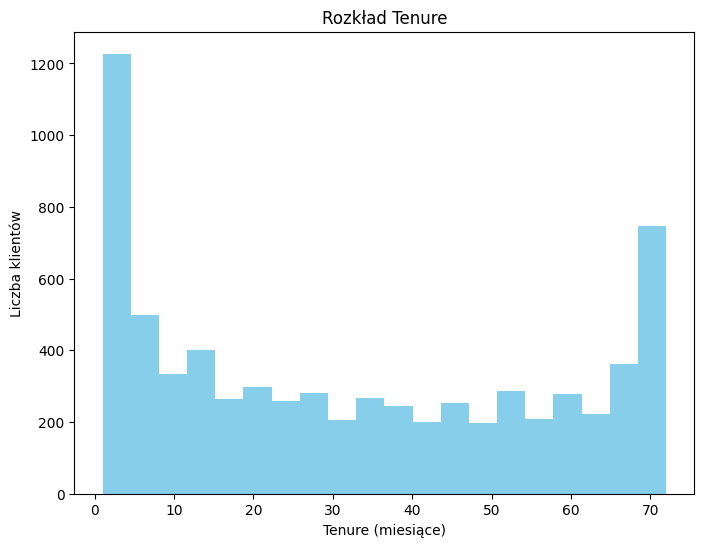

In [ ]:

data['tenure'].plot(kind='hist', bins=20, color='skyblue', figsize=(8, 6))
plt.title('Rozkład Tenure')
plt.xlabel('Tenure (miesiące)')
plt.ylabel('Liczba klientów')
plt.show()


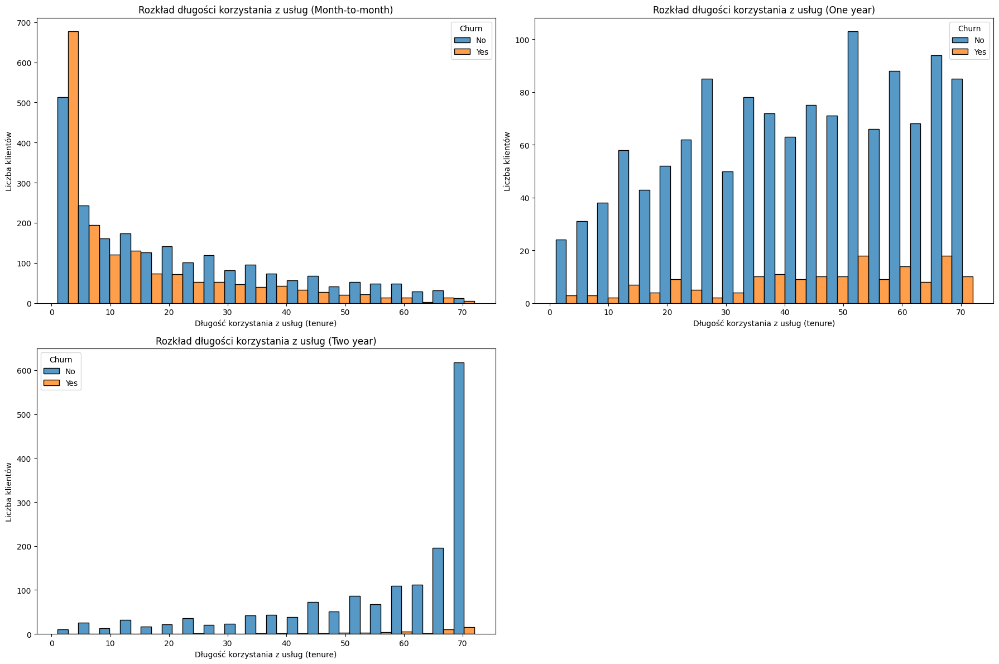

In [ ]:
plt.figure(figsize=(18, 12))

contracts = data['Contract'].unique()

for i, contract in enumerate(contracts, 1):
    plt.subplot(2, 2, i)

    contract_data = data[data['Contract'] == contract]

    sns.histplot(contract_data, x='tenure', hue='Churn', multiple='dodge', bins=20, kde=False)

    plt.title(f'Rozkład długości korzystania z usług ({contract})')
    plt.xlabel('Długość korzystania z usług (tenure)')
    plt.ylabel('Liczba klientów')

plt.tight_layout()
plt.show()


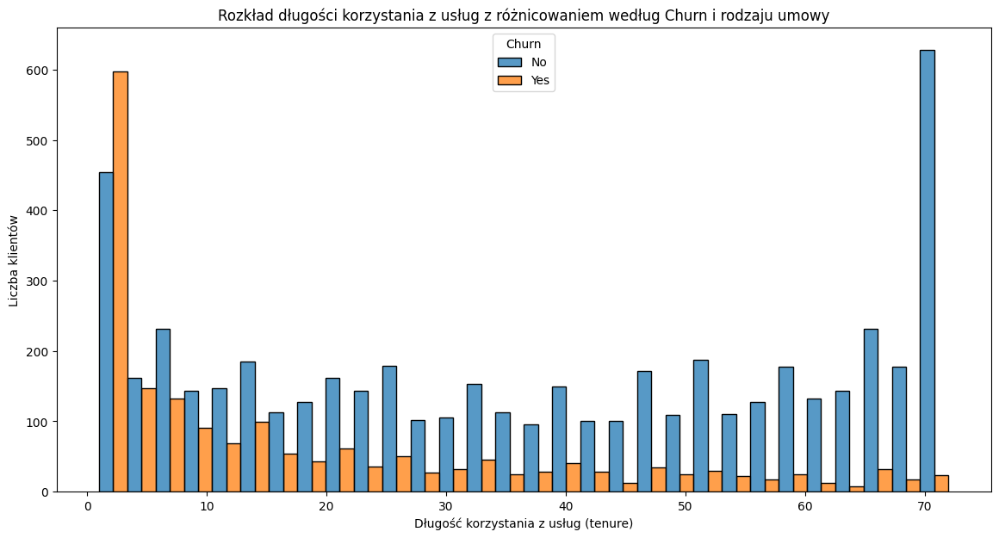

In [ ]:
plt.figure(figsize=(14, 7))
sns.histplot(data=data, x='tenure', hue='Churn', multiple='dodge', kde=False, bins=30)
plt.title('Rozkład długości korzystania z usług z różnicowaniem według Churn i rodzaju umowy')
plt.xlabel('Długość korzystania z usług (tenure)')
plt.ylabel('Liczba klientów')
plt.show()


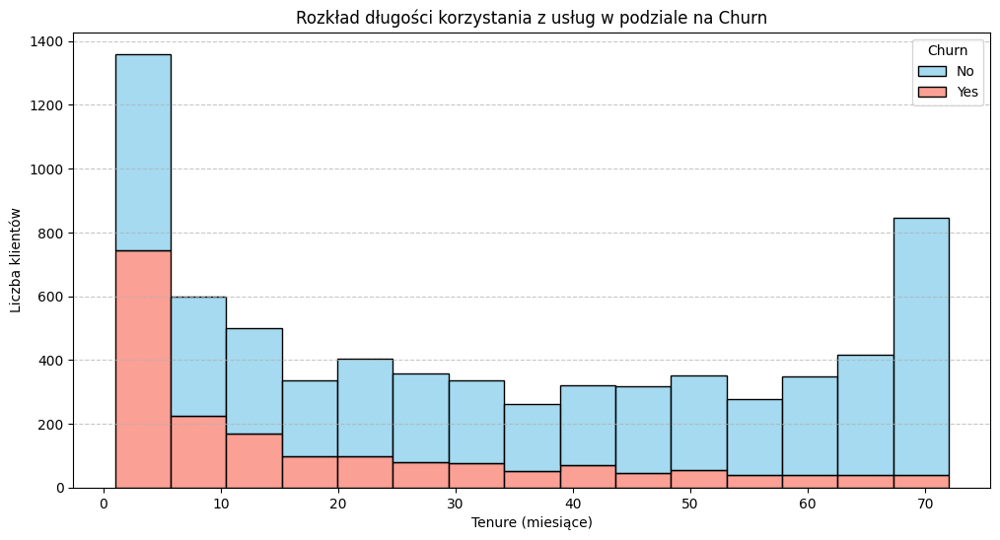

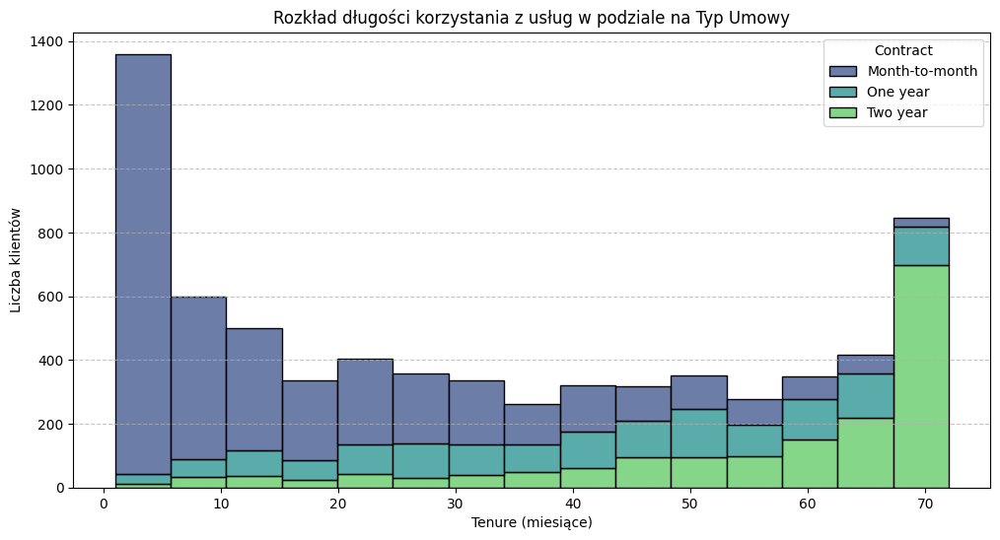

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(data=data, x='tenure', hue='Churn', multiple='stack', kde=False, palette=['skyblue', 'salmon'])
plt.title('Rozkład długości korzystania z usług w podziale na Churn')
plt.xlabel('Tenure (miesiące)')
plt.ylabel('Liczba klientów')
#plt.legend(title='Churn', labels=['Nie', 'Tak'])
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

plt.figure(figsize=(12, 6))
sns.histplot(data=data, x='tenure', hue='Contract', multiple='stack', kde=False, palette='viridis')
plt.title('Rozkład długości korzystania z usług w podziale na Typ Umowy')
plt.xlabel('Tenure (miesiące)')
plt.ylabel('Liczba klientów')
#plt.legend(title='Typ umowy')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

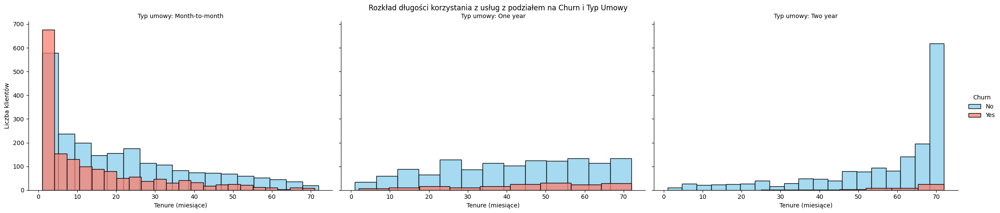

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.FacetGrid(data, col="Contract", hue="Churn", height=5, aspect=1.5, palette=['skyblue', 'salmon'])
g.map(sns.histplot, "tenure", kde=False, multiple="stack")

g.set_axis_labels("Tenure (miesiące)", "Liczba klientów")
g.set_titles("Typ umowy: {col_name}")
g.add_legend(title="Churn")
plt.subplots_adjust(top=0.9)
g.fig.suptitle("Rozkład długości korzystania z usług z podziałem na Churn i Typ Umowy")
plt.show()


In [ ]:

cohort_churn = data.groupby('tenure')['Churn'].value_counts(normalize=True).unstack()['Yes'] * 100

print(cohort_churn.head(10))



tenure
1     61.990212
2     51.680672
3     47.000000
4     47.159091
5     48.120301
6     36.363636
7     38.931298
8     34.146341
9     38.655462
10    38.793103
Name: Yes, dtype: float64


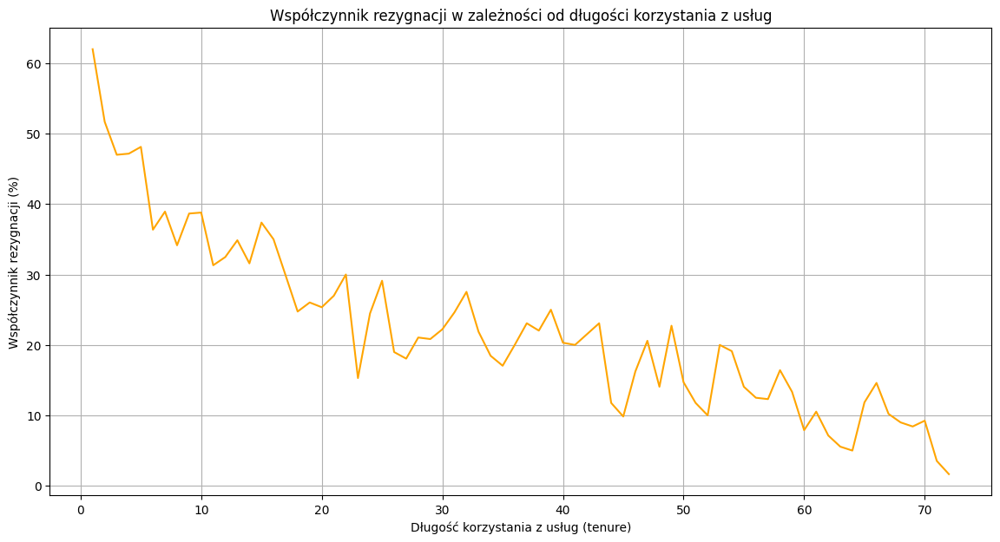

In [ ]:
plt.figure(figsize=(14, 7))
cohort_churn.plot(kind='line', color='orange')
plt.title('Współczynnik rezygnacji w zależności od długości korzystania z usług')
plt.xlabel('Długość korzystania z usług (tenure)')
plt.ylabel('Współczynnik rezygnacji (%)')
plt.grid()
plt.show()


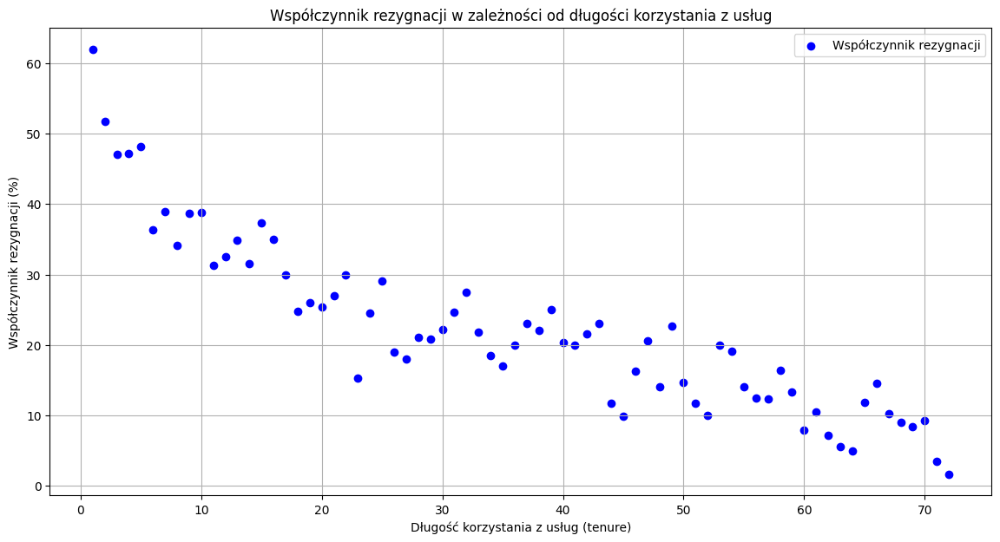

In [ ]:
plt.figure(figsize=(14, 7))
plt.scatter(cohort_churn.index, cohort_churn, color='blue', label='Współczynnik rezygnacji')
plt.title('Współczynnik rezygnacji w zależności od długości korzystania z usług')
plt.xlabel('Długość korzystania z usług (tenure)')
plt.ylabel('Współczynnik rezygnacji (%)')
plt.grid()
plt.legend()
plt.show()


In [ ]:
bins = [0, 12, 24, 48, data['tenure'].max()]
labels = ['0-12 miesięcy', '12-24 miesięcy', '24-48 miesięcy', 'Powyżej 48 miesięcy']
data['tenure_group'] = pd.cut(data['tenure'], bins=bins, labels=labels, right=False)

print(data[['tenure', 'tenure_group']].head(10))


   tenure         tenure_group
0       1        0-12 miesięcy
1      34       24-48 miesięcy
2       2        0-12 miesięcy
3      45       24-48 miesięcy
4       2        0-12 miesięcy
5       8        0-12 miesięcy
6      22       12-24 miesięcy
7      10        0-12 miesięcy
8      28       24-48 miesięcy
9      62  Powyżej 48 miesięcy


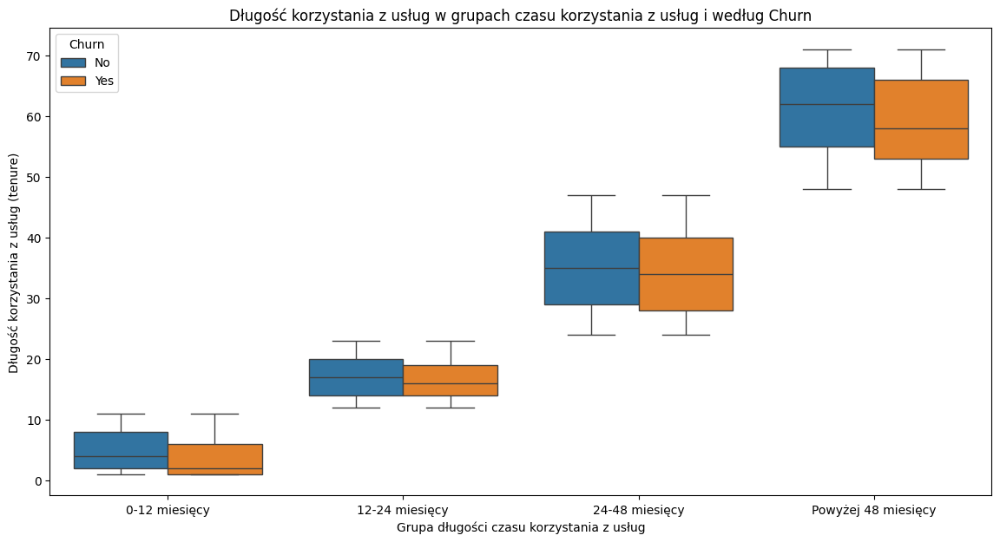

In [ ]:
plt.figure(figsize=(14, 7))
sns.boxplot(data=data, x='tenure_group', y='tenure', hue='Churn')
plt.title('Długość korzystania z usług w grupach czasu korzystania z usług i według Churn')
plt.xlabel('Grupa długości czasu korzystania z usług')
plt.ylabel('Długość korzystania z usług (tenure)')
plt.show()


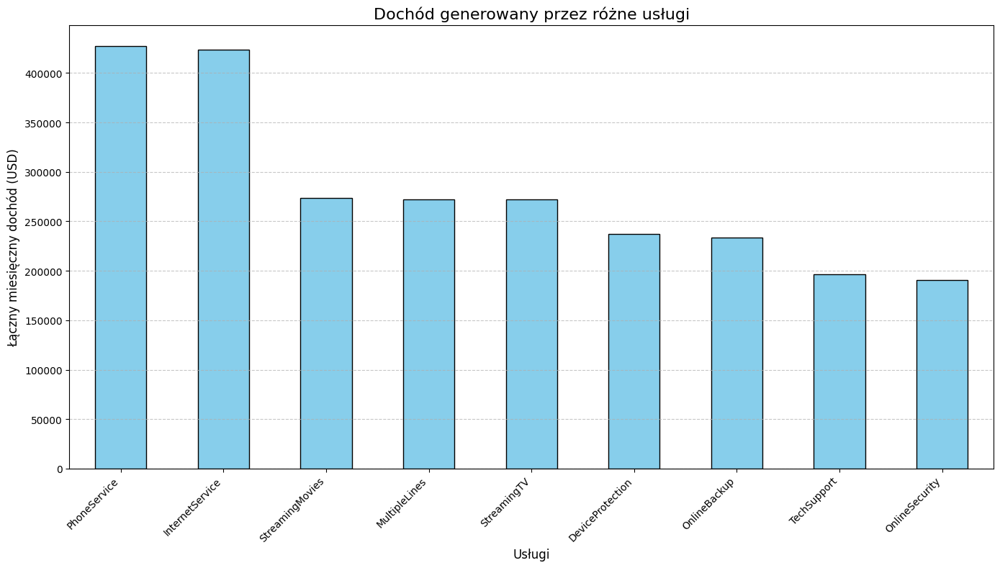

In [ ]:
services_columns = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
                    'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']

services_long = data.melt(
    id_vars=['customerID', 'MonthlyCharges'],
    value_vars=services_columns,
    var_name='Service',
    value_name='Response'
)

services_long['Response'] = services_long['Response'].apply(lambda x: 'Yes' if x != 'No' else 'No')

profitability_summary = (
    services_long[services_long['Response'] == 'Yes']
    .groupby('Service')['MonthlyCharges']
    .sum()
    .sort_values(ascending=False)
)

plt.figure(figsize=(14, 8))
profitability_summary.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title("Dochód generowany przez różne usługi", fontsize=16)
plt.ylabel("Łączny miesięczny dochód (USD)", fontsize=12)
plt.xlabel("Usługi", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


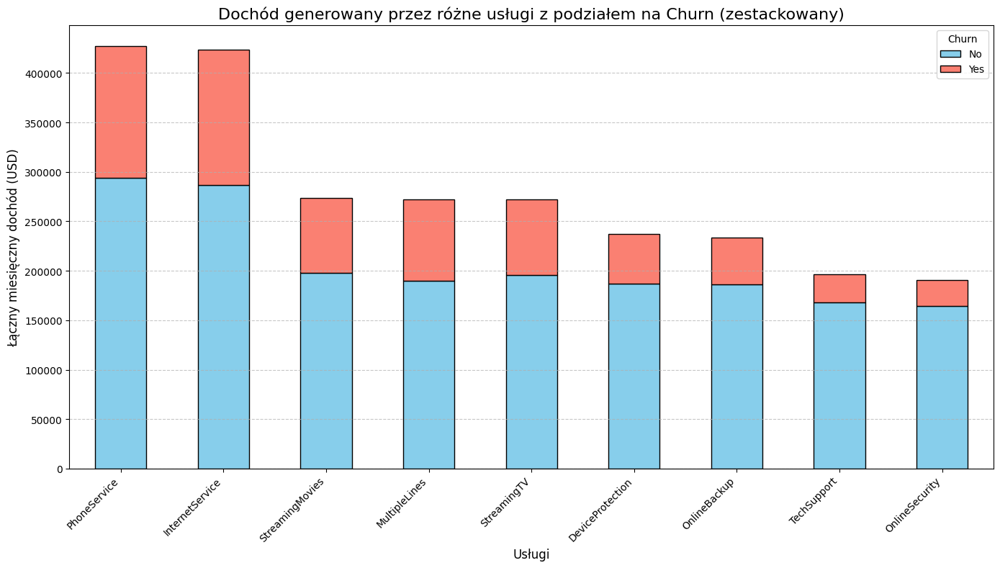

In [ ]:

services_columns = ['PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
                    'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies']

services_long = data.melt(
    id_vars=['customerID', 'MonthlyCharges', 'Churn'],
    value_vars=services_columns,
    var_name='Service',
    value_name='Response'
)

services_long['Response'] = services_long['Response'].apply(lambda x: 'Yes' if x != 'No' else 'No')

profitability_by_churn = (
    services_long[services_long['Response'] == 'Yes']
    .groupby(['Service', 'Churn'])['MonthlyCharges']
    .sum()
    .unstack(fill_value=0)
)

profitability_by_churn['Total'] = profitability_by_churn.sum(axis=1)

profitability_sorted = profitability_by_churn.sort_values(by='Total', ascending=False).drop(columns='Total')

profitability_sorted.plot(
    kind='bar',
    stacked=True,
    figsize=(14, 8),
    color=['skyblue', 'salmon'],
    edgecolor='black'
)

plt.title("Dochód generowany przez różne usługi z podziałem na Churn (zestackowany)", fontsize=16)
plt.ylabel("Łączny miesięczny dochód (USD)", fontsize=12)
plt.xlabel("Usługi", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.legend(title="Churn", labels=['No', 'Yes'], fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()



In [ ]:
data_encoded = data.drop(columns=['customerID', 'MonthlyCharges', 'TotalCharges'])

data_encoded = pd.get_dummies(data_encoded, drop_first=True)

print(data_encoded.head())

features = data_encoded.drop(columns=['Churn_Yes'])
labels = data_encoded['Churn_Yes']

print(f"Kształt macierzy cech: {features.shape}")
print(f"Kształt etykiet: {labels.shape}")


   SeniorCitizen  tenure  gender_Male  Partner_Yes  Dependents_Yes  \
0              0       1        False         True           False   
1              0      34         True        False           False   
2              0       2         True        False           False   
3              0      45         True        False           False   
4              0       2        False        False           False   

   PhoneService_Yes  MultipleLines_No phone service  MultipleLines_Yes  \
0             False                            True              False   
1              True                           False              False   
2              True                           False              False   
3             False                            True              False   
4              True                           False              False   

   InternetService_Fiber optic  InternetService_No  ...  \
0                        False               False  ...   
1               

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(
    features, labels, test_size=1100, random_state=42, stratify=labels
)

print(f"Rozmiar zbioru treningowego: {X_train.shape}, {y_train.shape}")
print(f"Rozmiar zbioru testowego: {X_test.shape}, {y_test.shape}")


Rozmiar zbioru treningowego: (5932, 34), (5932,)
Rozmiar zbioru testowego: (1100, 34), (1100,)


Raport klasyfikacji dla drzewa decyzyjnego:
              precision    recall  f1-score   support

       False       0.81      0.81      0.81       808
        True       0.47      0.47      0.47       292

    accuracy                           0.72      1100
   macro avg       0.64      0.64      0.64      1100
weighted avg       0.72      0.72      0.72      1100



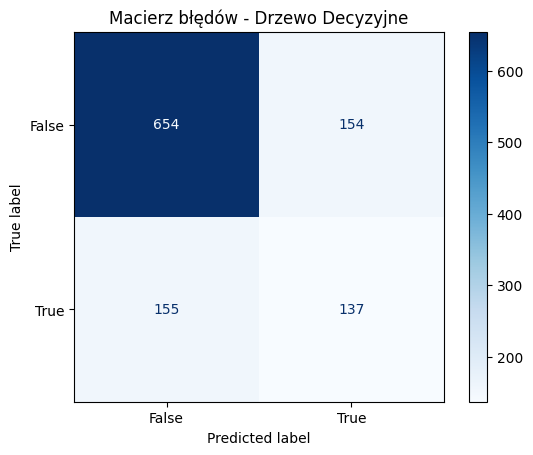

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train, y_train)

y_pred_dt = dt_model.predict(X_test)

print("Raport klasyfikacji dla drzewa decyzyjnego:")
print(classification_report(y_test, y_pred_dt))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_dt, cmap='Blues')
plt.title("Macierz błędów - Drzewo Decyzyjne")
plt.show()


In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(200, 50))
plot_tree(dt_model, filled=True, feature_names=X_train.columns, class_names=['No', 'Yes'], rounded=True, fontsize=12)
plt.title("Drzewo Decyzyjne")
plt.show()


In [ ]:
feature_importances = pd.Series(dt_model.feature_importances_, index=X_train.columns)
print("Wagi cech (niezoptymalizowane drzewo decyzyjne):\n", feature_importances.sort_values(ascending=False))


Wagi cech (niezoptymalizowane drzewo decyzyjne):
 tenure                                   0.348445
InternetService_Fiber optic              0.114564
PaperlessBilling_Yes                     0.042118
gender_Male                              0.040999
Partner_Yes                              0.039782
Dependents_Yes                           0.034182
MultipleLines_Yes                        0.033546
DeviceProtection_Yes                     0.032334
SeniorCitizen                            0.031480
TechSupport_Yes                          0.030678
PaymentMethod_Electronic check           0.029899
OnlineSecurity_Yes                       0.029138
StreamingTV_Yes                          0.028858
OnlineBackup_Yes                         0.027582
StreamingMovies_Yes                      0.025994
PaymentMethod_Credit card (automatic)    0.021130
PaymentMethod_Mailed check               0.019471
Contract_One year                        0.014839
TechSupport_No internet service          0.014667


Wagi cech w drzewie decyzyjnym:
                        Feature  Importance
1                        tenure    0.348445
8   InternetService_Fiber optic    0.114564
24         PaperlessBilling_Yes    0.042118
2                   gender_Male    0.040999
3                   Partner_Yes    0.039782
4                Dependents_Yes    0.034182
7             MultipleLines_Yes    0.033546
15         DeviceProtection_Yes    0.032334
0                 SeniorCitizen    0.031480
17              TechSupport_Yes    0.030678


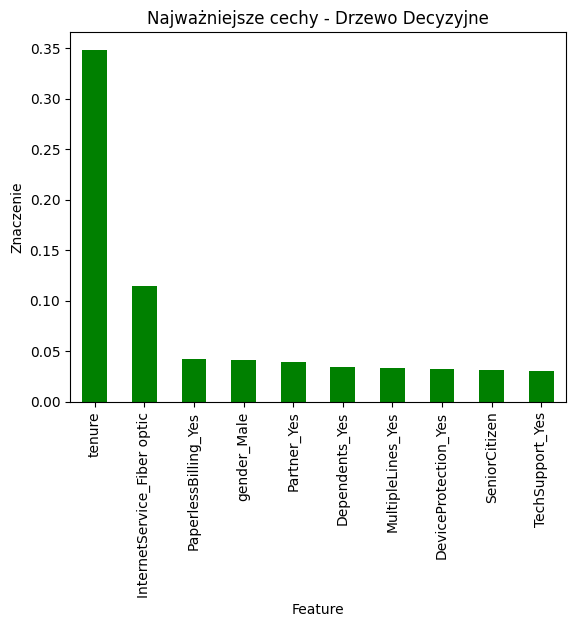

In [ ]:

feature_importances = pd.DataFrame({
    'Feature': features.columns,
    'Importance': dt_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

print("Wagi cech w drzewie decyzyjnym:")
print(feature_importances.head(10))

feature_importances.head(10).plot(kind='bar', x='Feature', y='Importance', legend=False, color='green')
plt.title("Najważniejsze cechy - Drzewo Decyzyjne")
plt.ylabel("Znaczenie")
plt.show()


Raport klasyfikacji dla k-NN:
              precision    recall  f1-score   support

       False       0.84      0.84      0.84       808
        True       0.56      0.56      0.56       292

    accuracy                           0.77      1100
   macro avg       0.70      0.70      0.70      1100
weighted avg       0.77      0.77      0.77      1100



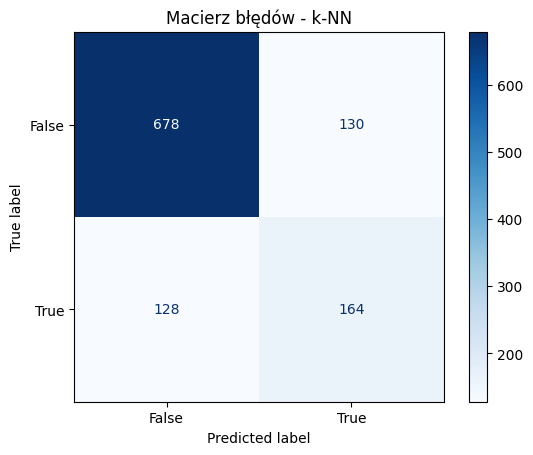

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)

y_pred_knn = knn_model.predict(X_test)

print("Raport klasyfikacji dla k-NN:")
print(classification_report(y_test, y_pred_knn))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_knn, cmap='Blues')
plt.title("Macierz błędów - k-NN")
plt.show()


Raport klasyfikacji dla regresji logistycznej:
              precision    recall  f1-score   support

       False       0.84      0.88      0.86       808
        True       0.61      0.52      0.56       292

    accuracy                           0.79      1100
   macro avg       0.72      0.70      0.71      1100
weighted avg       0.78      0.79      0.78      1100



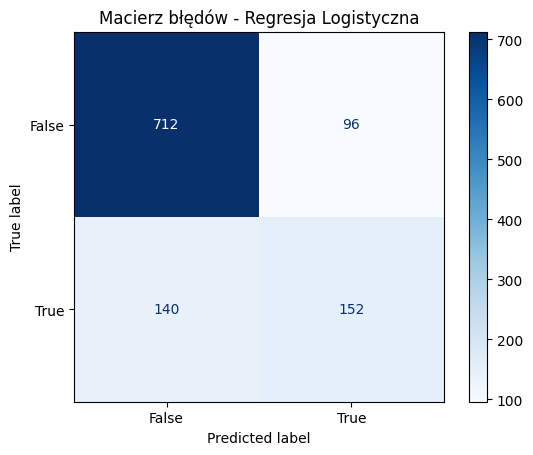

In [ ]:
from sklearn.linear_model import LogisticRegression

logistic_model = LogisticRegression(max_iter=1000, random_state=42)
logistic_model.fit(X_train, y_train)

y_pred_logistic = logistic_model.predict(X_test)

print("Raport klasyfikacji dla regresji logistycznej:")
print(classification_report(y_test, y_pred_logistic))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_logistic, cmap='Blues')
plt.title("Macierz błędów - Regresja Logistyczna")
plt.show()


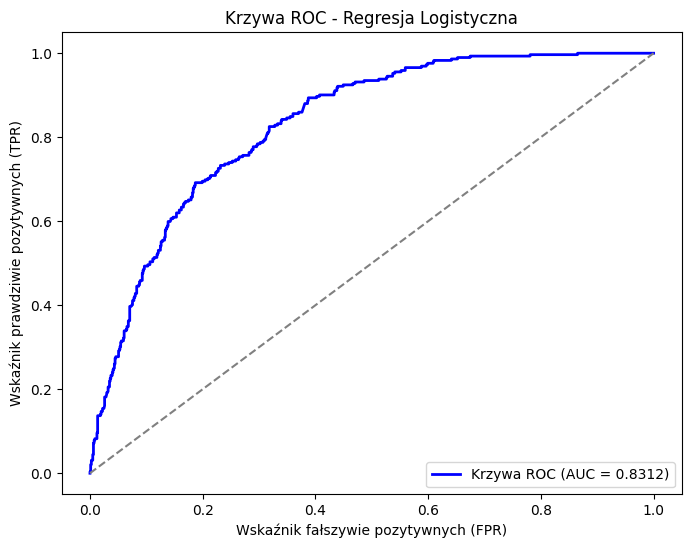

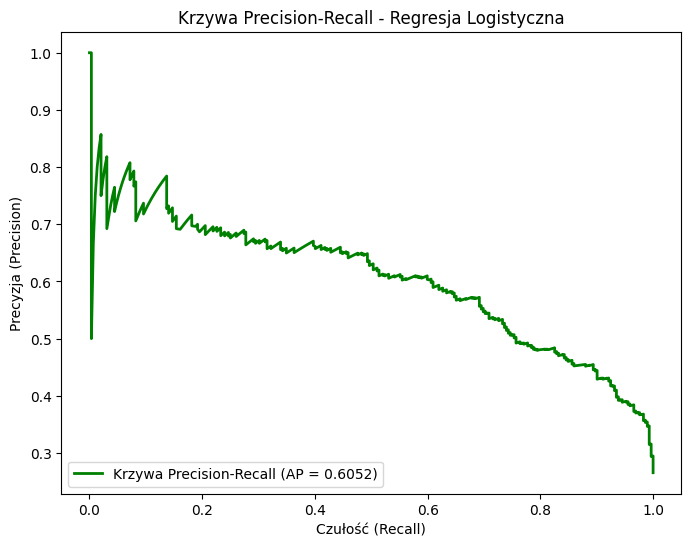

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import roc_curve, roc_auc_score, precision_recall_curve, average_precision_score
import matplotlib.pyplot as plt

y_prob_logistic = logistic_model.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_prob_logistic)
roc_auc = roc_auc_score(y_test, y_prob_logistic)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Krzywa ROC (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('Wskaźnik fałszywie pozytywnych (FPR)')
plt.ylabel('Wskaźnik prawdziwie pozytywnych (TPR)')
plt.title('Krzywa ROC - Regresja Logistyczna')
plt.legend(loc='lower right')
plt.show()

precision, recall, thresholds_pr = precision_recall_curve(y_test, y_prob_logistic)
avg_precision = average_precision_score(y_test, y_prob_logistic)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='green', lw=2, label=f'Krzywa Precision-Recall (AP = {avg_precision:.4f})')
plt.xlabel('Czułość (Recall)')
plt.ylabel('Precyzja (Precision)')
plt.title('Krzywa Precision-Recall - Regresja Logistyczna')
plt.legend(loc='lower left')
plt.show()

In [ ]:
models = ['Decision Tree', 'KNN', 'Logistic Regression']
accuracies = [
    dt_model.score(X_test, y_test),
    knn_model.score(X_test, y_test),
    logistic_model.score(X_test, y_test)
]
results = pd.DataFrame({'Model': models, 'Accuracy': accuracies})
print("Porównanie niezoptymalizowanych modeli:\n", results)


Porównanie niezoptymalizowanych modeli:
                  Model  Accuracy
0        Decision Tree  0.719091
1                  KNN  0.765455
2  Logistic Regression  0.785455


In [ ]:
from sklearn.model_selection import GridSearchCV

param_grid_dt = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_dt = GridSearchCV(
    estimator=DecisionTreeClassifier(random_state=42),
    param_grid=param_grid_dt,
    scoring='accuracy',
    cv=5,
    verbose=1
)
grid_search_dt.fit(X_train, y_train)


print("Najlepsze parametry drzewa decyzyjnego:")
print(grid_search_dt.best_params_)


Fitting 5 folds for each of 36 candidates, totalling 180 fits
Najlepsze parametry drzewa decyzyjnego:
{'max_depth': 5, 'min_samples_leaf': 2, 'min_samples_split': 10}


Raport klasyfikacji dla zoptymalizowanego drzewa decyzyjnego:
              precision    recall  f1-score   support

       False       0.83      0.87      0.85       808
        True       0.59      0.51      0.55       292

    accuracy                           0.78      1100
   macro avg       0.71      0.69      0.70      1100
weighted avg       0.77      0.78      0.77      1100



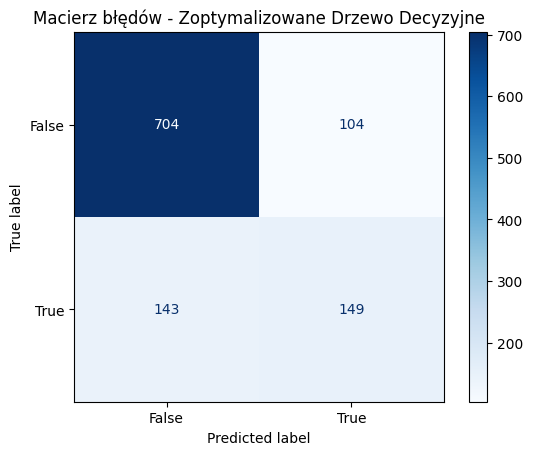

In [ ]:

y_pred_optimized_dt = grid_search_dt.best_estimator_.predict(X_test)


print("Raport klasyfikacji dla zoptymalizowanego drzewa decyzyjnego:")
print(classification_report(y_test, y_pred_optimized_dt))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_optimized_dt, cmap='Blues')
plt.title("Macierz błędów - Zoptymalizowane Drzewo Decyzyjne")
plt.show()


In [ ]:
feature_importances_opt = pd.Series(grid_search_dt.best_estimator_.feature_importances_, index=X_train.columns)
print("Wagi cech (zoptymalizowane drzewo decyzyjne):\n", feature_importances_opt.sort_values(ascending=False))


Wagi cech (zoptymalizowane drzewo decyzyjne):
 tenure                                   0.475934
InternetService_Fiber optic              0.340611
PaymentMethod_Electronic check           0.039902
TechSupport_No internet service          0.034992
Contract_Two year                        0.023712
MultipleLines_Yes                        0.020258
OnlineSecurity_Yes                       0.013038
TechSupport_Yes                          0.011329
Contract_One year                        0.009396
SeniorCitizen                            0.008422
OnlineBackup_Yes                         0.006322
PhoneService_Yes                         0.006233
StreamingMovies_Yes                      0.005700
OnlineSecurity_No internet service       0.002156
PaymentMethod_Credit card (automatic)    0.001106
MultipleLines_No phone service           0.000889
PaperlessBilling_Yes                     0.000000
tenure_group_24-48 miesięcy              0.000000
tenure_group_12-24 miesięcy              0.000000
Ten

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(200, 50))
plot_tree(grid_search_dt.best_estimator_, filled=True, feature_names=X_train.columns, class_names=['No', 'Yes'], rounded=True, fontsize=12)
plt.title("Drzewo Decyzyjne")
plt.show()


Najlepsze parametry dla k-najbliższych sąsiadów: {'metric': 'manhattan', 'n_neighbors': 10, 'weights': 'uniform'}
              precision    recall  f1-score   support

       False       0.82      0.89      0.86       808
        True       0.61      0.47      0.53       292

    accuracy                           0.78      1100
   macro avg       0.72      0.68      0.69      1100
weighted avg       0.77      0.78      0.77      1100

Macierz błędów dla k-najbliższych sąsiadów:
 [[722  86]
 [156 136]]


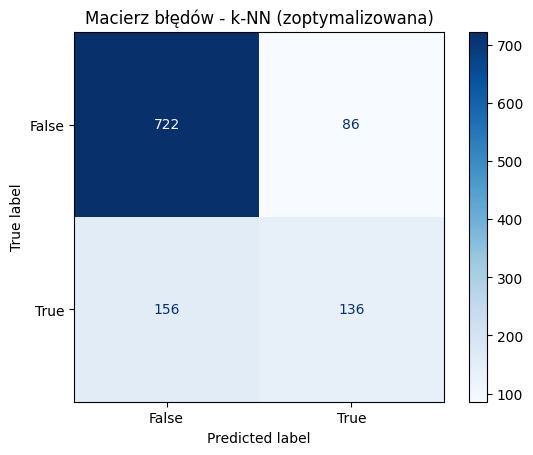

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier()
param_grid_knn = {
    'n_neighbors': [3, 5, 7, 10],
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}


grid_knn = GridSearchCV(knn, param_grid_knn, cv=5, scoring='accuracy')
grid_knn.fit(X_train, y_train)

print("Najlepsze parametry dla k-najbliższych sąsiadów:", grid_knn.best_params_)
y_pred_knn = grid_knn.best_estimator_.predict(X_test)
print(classification_report(y_test, y_pred_knn))
print("Macierz błędów dla k-najbliższych sąsiadów:\n", confusion_matrix(y_test, y_pred_knn))

ConfusionMatrixDisplay.from_predictions(y_test, y_pred_knn, cmap='Blues')
plt.title("Macierz błędów - k-NN (zoptymalizowana)")
plt.show()

Najlepsze parametry dla regresji logistycznej: {'C': 0.1, 'solver': 'liblinear'}
              precision    recall  f1-score   support

       False       0.83      0.89      0.86       808
        True       0.62      0.51      0.56       292

    accuracy                           0.79      1100
   macro avg       0.73      0.70      0.71      1100
weighted avg       0.78      0.79      0.78      1100

Macierz błędów dla regresji logistycznej:
 [[717  91]
 [142 150]]


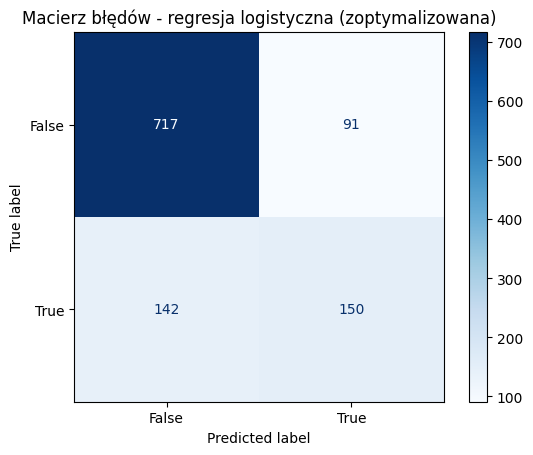

In [ ]:
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(random_state=42, max_iter=1000)
param_grid_logreg = {
    'C': [0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'lbfgs', 'saga']
}


grid_logreg = GridSearchCV(logreg, param_grid_logreg, cv=5, scoring='accuracy')
grid_logreg.fit(X_train, y_train)


print("Najlepsze parametry dla regresji logistycznej:", grid_logreg.best_params_)
y_pred_logreg = grid_logreg.best_estimator_.predict(X_test)
print(classification_report(y_test, y_pred_logreg))
print("Macierz błędów dla regresji logistycznej:\n", confusion_matrix(y_test, y_pred_logreg))
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_logreg, cmap='Blues')
plt.title("Macierz błędów - regresja logistyczna (zoptymalizowana)")
plt.show()

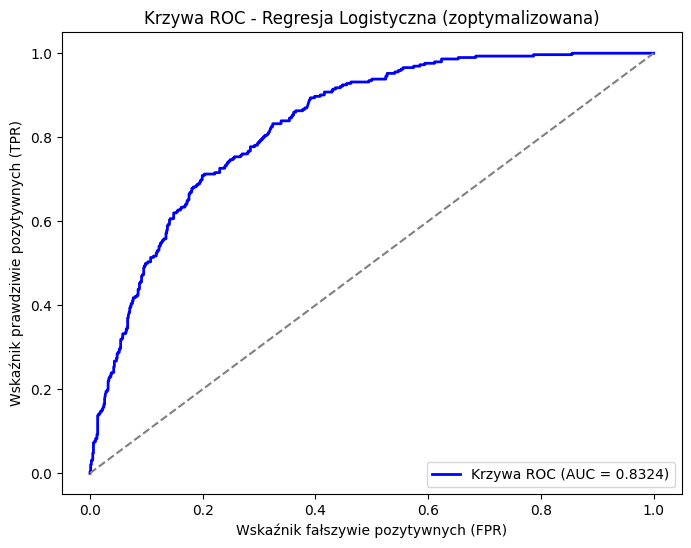

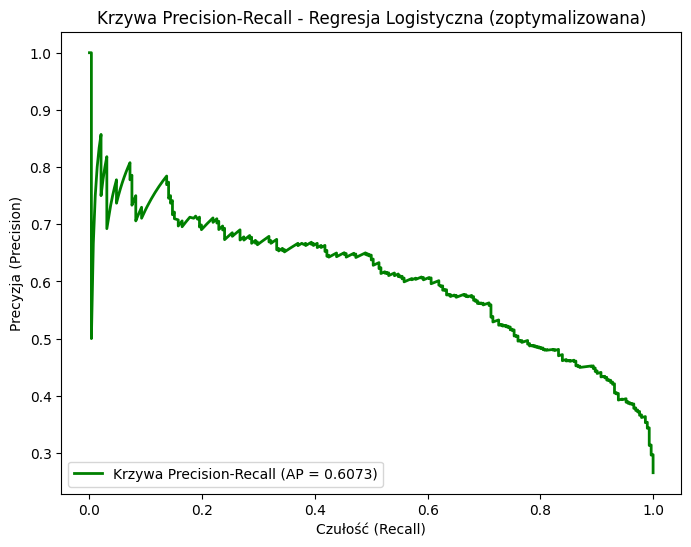

In [ ]:

y_prob_logreg = grid_logreg.best_estimator_.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_prob_logreg)
roc_auc = roc_auc_score(y_test, y_prob_logreg)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'Krzywa ROC (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('Wskaźnik fałszywie pozytywnych (FPR)')
plt.ylabel('Wskaźnik prawdziwie pozytywnych (TPR)')
plt.title('Krzywa ROC - Regresja Logistyczna (zoptymalizowana)')
plt.legend(loc='lower right')
plt.show()

precision, recall, thresholds_pr = precision_recall_curve(y_test, y_prob_logreg)
avg_precision = average_precision_score(y_test, y_prob_logreg)

plt.figure(figsize=(8, 6))
plt.plot(recall, precision, color='green', lw=2, label=f'Krzywa Precision-Recall (AP = {avg_precision:.4f})')
plt.xlabel('Czułość (Recall)')
plt.ylabel('Precyzja (Precision)')
plt.title('Krzywa Precision-Recall - Regresja Logistyczna (zoptymalizowana)')
plt.legend(loc='lower left')
plt.show()

In [ ]:

accuracies_opt = [
    grid_search_dt.best_score_,
    grid_knn.best_score_,
    grid_logreg.best_score_
]
results_opt = pd.DataFrame({'Model': models, 'Optimized Accuracy': accuracies_opt})
print("Porównanie zoptymalizowanych modeli:\n", results_opt)


Porównanie zoptymalizowanych modeli:
                  Model  Optimized Accuracy
0        Decision Tree            0.787594
1                  KNN            0.785403
2  Logistic Regression            0.805801


In [ ]:
improvements = [(opt - orig) for opt, orig in zip(accuracies_opt, accuracies)]
improvement_df = pd.DataFrame({'Model': models, 'Improvement': improvements})
print("Poprawa dokładności po optymalizacji:\n", improvement_df)


Poprawa dokładności po optymalizacji:
                  Model  Improvement
0        Decision Tree     0.068503
1                  KNN     0.019948
2  Logistic Regression     0.020346


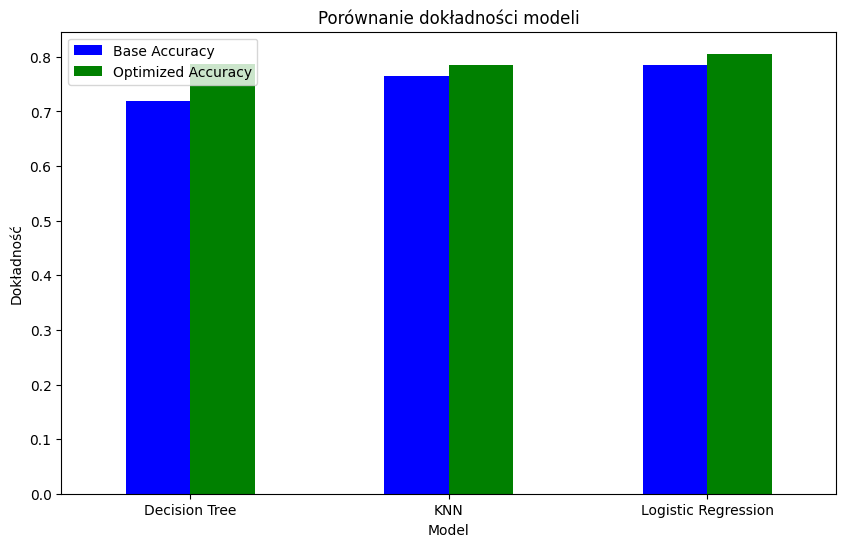

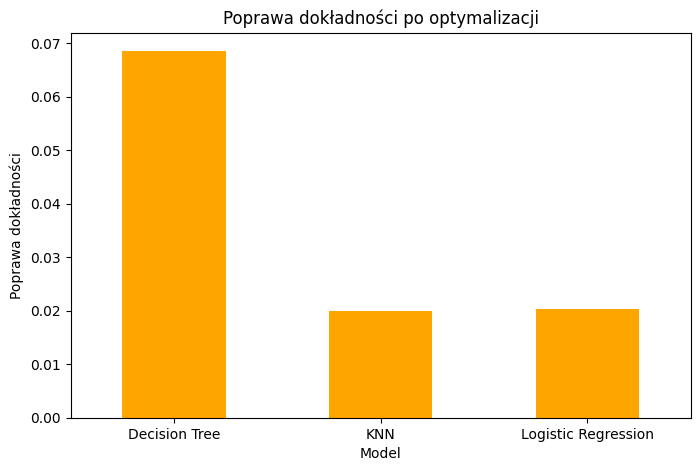

In [ ]:

results_combined = pd.DataFrame({
    'Model': models,
    'Base Accuracy': accuracies,
    'Optimized Accuracy': accuracies_opt
})

results_combined.plot(
    kind='bar',
    x='Model',
    y=['Base Accuracy', 'Optimized Accuracy'],
    title='Porównanie dokładności modeli',
    figsize=(10, 6),
    color=['blue', 'green']
)
plt.ylabel('Dokładność')
plt.xticks(rotation=0)
plt.show()

improvement_df.plot(
    kind='bar',
    x='Model',
    y='Improvement',
    color='orange',
    title='Poprawa dokładności po optymalizacji',
    figsize=(8, 5),
    legend=False
)
plt.ylabel('Poprawa dokładności')
plt.xticks(rotation=0)
plt.show()


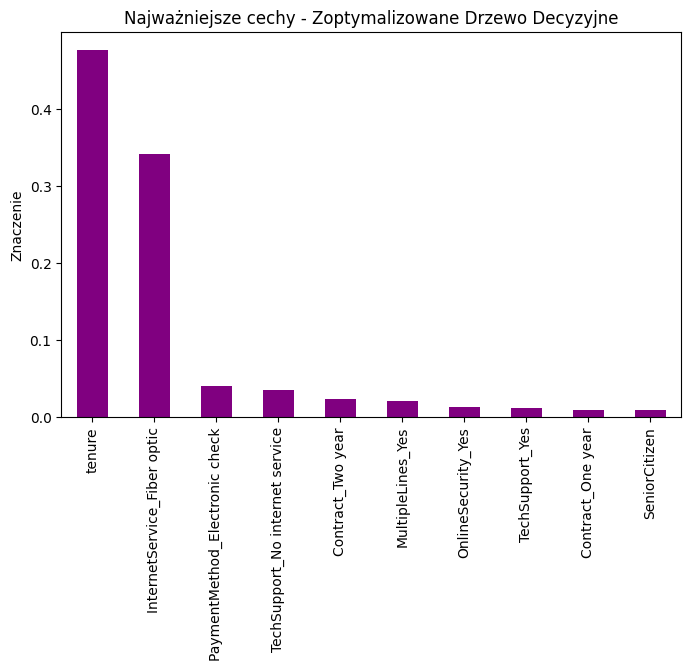

In [ ]:
feature_importances_opt_sorted = feature_importances_opt.sort_values(ascending=False).head(10)

feature_importances_opt_sorted.plot(
    kind='bar',
    title='Najważniejsze cechy - Zoptymalizowane Drzewo Decyzyjne',
    figsize=(8, 5),
    color='purple'
)
plt.ylabel('Znaczenie')
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

base_metrics = {
    'Model': models,
    'Accuracy': [accuracy_score(y_test, y_pred_dt),
                 accuracy_score(y_test, y_pred_knn),
                 accuracy_score(y_test, y_pred_logistic)],
    'Precision': [precision_score(y_test, y_pred_dt),
                  precision_score(y_test, y_pred_knn),
                  precision_score(y_test, y_pred_logistic)],
    'Recall': [recall_score(y_test, y_pred_dt),
               recall_score(y_test, y_pred_knn),
               recall_score(y_test, y_pred_logistic)],
    'F1-Score': [f1_score(y_test, y_pred_dt),
                 f1_score(y_test, y_pred_knn),
                 f1_score(y_test, y_pred_logistic)]
}

base_df = pd.DataFrame(base_metrics)

optimized_metrics = {
    'Model': models,
    'Accuracy': [accuracy_score(y_test, y_pred_optimized_dt),
                 accuracy_score(y_test, grid_knn.best_estimator_.predict(X_test)),
                 accuracy_score(y_test, grid_logreg.best_estimator_.predict(X_test))],
    'Precision': [precision_score(y_test, y_pred_optimized_dt),
                  precision_score(y_test, grid_knn.best_estimator_.predict(X_test)),
                  precision_score(y_test, grid_logreg.best_estimator_.predict(X_test))],
    'Recall': [recall_score(y_test, y_pred_optimized_dt),
               recall_score(y_test, grid_knn.best_estimator_.predict(X_test)),
               recall_score(y_test, grid_logreg.best_estimator_.predict(X_test))],
    'F1-Score': [f1_score(y_test, y_pred_optimized_dt),
                 f1_score(y_test, grid_knn.best_estimator_.predict(X_test)),
                 f1_score(y_test, grid_logreg.best_estimator_.predict(X_test))]
}

optimized_df = pd.DataFrame(optimized_metrics)

comparison_df = base_df.merge(optimized_df, on='Model', suffixes=('_Base', '_Optimized'))
comparison_df


,Model,Accuracy_Base,Precision_Base,Recall_Base,F1-Score_Base,Accuracy_Optimized,Precision_Optimized,Recall_Optimized,F1-Score_Optimized
0,Decision Tree,0.719091,0.470790,0.469178,0.469983,0.775455,0.588933,0.510274,0.546789
1,KNN,0.780000,0.612613,0.465753,0.529183,0.780000,0.612613,0.465753,0.529183
2,Logistic Regression,0.785455,0.612903,0.520548,0.562963,0.788182,0.622407,0.513699,0.562852


In [ ]:
comparison_data = {
    'Model': models,
    'Base Accuracy': [round(acc, 4) for acc in accuracies],
    'Optimized Accuracy': [round(opt_acc, 4) for opt_acc in accuracies_opt],
    'Improvement': [round(imp, 4) for imp in improvements]
}

comparison_df = pd.DataFrame(comparison_data)

comparison_df


,Model,Base Accuracy,Optimized Accuracy,Improvement
0,Decision Tree,0.7191,0.7876,0.0685
1,KNN,0.7655,0.7854,0.0199
2,Logistic Regression,0.7855,0.8058,0.0203
